## Data
### https://data.cityofchicago.org/Public-Safety/Crimes-2001-to-Present/ijzp-q8t2
#### This dataset includes reported incidents of crime (with the exception of murders, for which data is available for each victim) that occurred in the City of Chicago between 2001 and the present, minus the most recent seven days. The information is derived from the Chicago Police Department's CLEAR (Citizen Law Enforcement Analysis and Reporting) system. Addresses are shown at the block level only to protect the privacy of crime victims, and specific locations are not identified.
##### Data Description
##### 1. ID -  Unique identifier for the record. 
##### 2. Case Number - The Chicago Police Department RD Number
##### 3. Date - Date when the incident occurred. this is sometimes a best estimate.
##### 4. Block - The partially redacted address where the incident occurred.
##### 5. IUCR - The Illinois Unifrom Crime Reporting code.
##### 6. Primary Type - The primary description of the IUCR code.
##### 7. Description - The secondary description of the IUCR code, a subcategory of the primary description.
##### 8.  Location Description - Description of the location where the incident occurred.
##### 9 . Arrest - Indicates whether an arrest was made.
##### 10. Domestic - Indicates whether the incident was domestic-related as defined by the Illinois Domestic Violence Act.
##### 11. Beat - Indicates the beat where the incident occurred.
##### 12. District - Indicates the police district where the incident occurred.
##### 13. Ward - The ward (City Council district) where the incident occurred.
##### 14. Community Area - Indicates the community area where the incident occurred.
##### 15. FBI Code - Indicates the crime classification as outlined in the FBI's National Incident-Based Reporting System (NIBRS).
##### 16. X Coordinate - The x coordinate of the location where the incident occurred
##### 17. Y Coordinate - The y coordinate of the location where the incident occurred
##### 18. Year - Year the incident occurred.
##### 19. Updated On - Date and time the record was last updated.
##### 20. Latitude - The latitude of the location where the incident occurred
##### 21. Longitude - The longitude of the location where the incident occurred. 
##### 22. The location where the incident occurred in a format that allows for creation of maps and other geographic operations on this data portal. 

## Basic Analysis and Visualization
### Importing required libraries

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import warnings
warnings.filterwarnings('ignore') 

### Chunked the data
### Working with new data file("df")

In [2]:
raw_data=pd.read_csv("Crimes_-_2001_to_Present.csv",low_memory=False,chunksize=100000)
#print(raw_data)

dfList = []
for i in raw_data:
    dfList.append(i)
    break
    
df = pd.concat(dfList,sort=False)


In [3]:
df.to_csv("Crimes_filtered.csv")

### Information of the data frame

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 22 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   ID                    100000 non-null  int64  
 1   Case Number           100000 non-null  object 
 2   Date                  100000 non-null  object 
 3   Block                 100000 non-null  object 
 4   IUCR                  100000 non-null  object 
 5   Primary Type          100000 non-null  object 
 6   Description           100000 non-null  object 
 7   Location Description  99729 non-null   object 
 8   Arrest                100000 non-null  bool   
 9   Domestic              100000 non-null  bool   
 10  Beat                  100000 non-null  int64  
 11  District              100000 non-null  int64  
 12  Ward                  99995 non-null   float64
 13  Community Area        99995 non-null   float64
 14  FBI Code              100000 non-null  object 
 15  X

### Printing number of columns, rows and shape of the dataframe

In [5]:
print("Number of rows ",df.shape[0])
print("Number of Columns ",df.shape[1])

Number of rows  100000
Number of Columns  22


In [6]:
df.shape

(100000, 22)

In [7]:
df.head()

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,Ward,Community Area,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location
0,10224738,HY411648,09/05/2015 01:30:00 PM,043XX S WOOD ST,0486,BATTERY,DOMESTIC BATTERY SIMPLE,RESIDENCE,False,True,...,12.0,61.0,08B,1165074.0,1875917.0,2015,02/10/2018 03:50:01 PM,41.815117,-87.670000,"(41.815117282, -87.669999562)"
1,10224739,HY411615,09/04/2015 11:30:00 AM,008XX N CENTRAL AVE,0870,THEFT,POCKET-PICKING,CTA BUS,False,False,...,29.0,25.0,06,1138875.0,1904869.0,2015,02/10/2018 03:50:01 PM,41.895080,-87.765400,"(41.895080471, -87.765400451)"
2,11646166,JC213529,09/01/2018 12:01:00 AM,082XX S INGLESIDE AVE,0810,THEFT,OVER $500,RESIDENCE,False,True,...,8.0,44.0,06,NaN,NaN,2018,04/06/2019 04:04:43 PM,NaN,NaN,NaN
3,10224740,HY411595,09/05/2015 12:45:00 PM,035XX W BARRY AVE,2023,NARCOTICS,POSS: HEROIN(BRN/TAN),SIDEWALK,True,False,...,35.0,21.0,18,1152037.0,1920384.0,2015,02/10/2018 03:50:01 PM,41.937406,-87.716650,"(41.937405765, -87.716649687)"
4,10224741,HY411610,09/05/2015 01:00:00 PM,0000X N LARAMIE AVE,0560,ASSAULT,SIMPLE,APARTMENT,False,True,...,28.0,25.0,08A,1141706.0,1900086.0,2015,02/10/2018 03:50:01 PM,41.881903,-87.755121,"(41.881903443, -87.755121152)"


### Checking the null values

In [8]:
df.isnull().sum()

ID                         0
Case Number                0
Date                       0
Block                      0
IUCR                       0
Primary Type               0
Description                0
Location Description     271
Arrest                     0
Domestic                   0
Beat                       0
District                   0
Ward                       5
Community Area             5
FBI Code                   0
X Coordinate            2224
Y Coordinate            2224
Year                       0
Updated On                 0
Latitude                2224
Longitude               2224
Location                2224
dtype: int64

### Visualising the missing values in a data frame using heat map

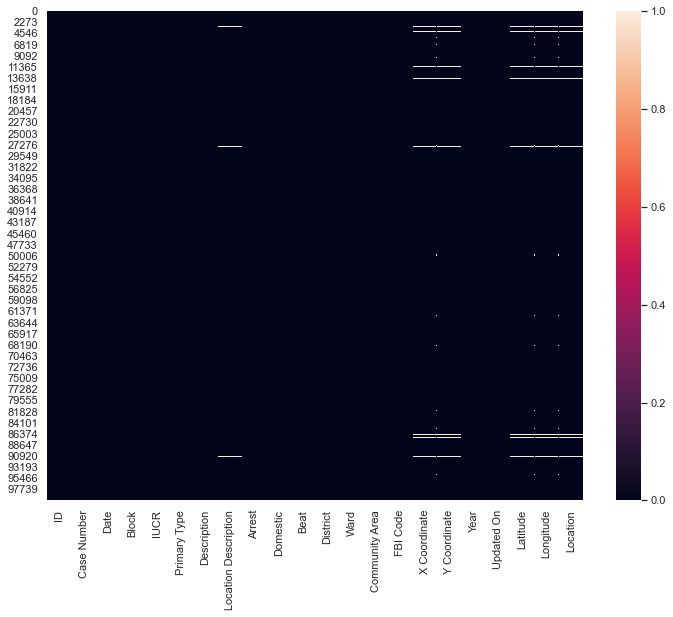

In [9]:
sns.set(rc = {'figure.figsize':(15,8)})
plt.figure(figsize=(12,9))
sns.heatmap(df.isna())
plt.show()

#### Here if we observe we have null values in 6 columns

### Describing the data

In [10]:
df.describe()

,ID,Beat,District,Ward,Community Area,X Coordinate,Y Coordinate,Year,Latitude,Longitude
count,1.000000e+05,100000.000000,100000.000000,99995.000000,99995.000000,9.777600e+04,9.777600e+04,100000.000000,97776.000000,97776.000000
mean,1.027929e+07,1142.603950,11.197060,22.885394,37.357988,1.164596e+06,1.885794e+06,2015.052490,41.842214,-87.671516
std,2.891364e+05,693.542944,6.929218,13.906594,21.423438,1.635833e+04,3.112593e+04,0.679382,0.085606,0.059545
min,1.016000e+03,111.000000,1.000000,1.000000,1.000000,1.094231e+06,1.813910e+06,2001.000000,41.644604,-87.928909
25%,1.019590e+07,612.000000,6.000000,10.000000,23.000000,1.152705e+06,1.858866e+06,2015.000000,41.768112,-87.714677
50%,1.024922e+07,1023.000000,10.000000,23.000000,32.000000,1.166248e+06,1.891648e+06,2015.000000,41.858459,-87.665422
75%,1.029266e+07,1711.000000,17.000000,34.000000,56.000000,1.176405e+06,1.908603e+06,2015.000000,41.904915,-87.627930
max,1.224746e+07,2535.000000,31.000000,50.000000,77.000000,1.205111e+06,1.951507e+06,2020.000000,42.022548,-87.524615


## Correlation

In [31]:
df.corr()

,ID,Arrest,Domestic,Beat,District,Ward,Community Area,X Coordinate,Y Coordinate,Year,Latitude,Longitude,Day,Month
ID,1.000000,-0.046335,-0.009141,0.005035,0.005963,0.009651,-0.006463,-0.005524,0.005069,0.724125,0.005080,-0.005496,-0.060282,0.047665
Arrest,-0.046335,1.000000,-0.046060,-0.013220,-0.013406,-0.013765,0.024491,-0.040779,-0.024123,-0.015634,-0.023904,-0.041468,0.010620,0.037153
Domestic,-0.009141,-0.046060,1.000000,-0.046632,-0.046583,-0.068260,0.073992,0.013224,-0.092206,-0.001825,-0.092059,0.011888,0.002664,-0.001231
Beat,0.005035,-0.013220,-0.046632,1.000000,0.999683,0.675104,-0.486562,-0.562240,0.631533,0.003542,0.632384,-0.557437,-0.006204,0.001740
District,0.005963,-0.013406,-0.046583,0.999683,1.000000,0.676341,-0.487008,-0.562951,0.632415,0.004037,0.633267,-0.558139,-0.006186,0.001837
Ward,0.009651,-0.013765,-0.068260,0.675104,0.676341,1.000000,-0.539416,-0.456439,0.658382,0.012153,0.658740,-0.450338,-0.011815,-0.002267
Community Area,-0.006463,0.024491,0.073992,-0.486562,-0.487008,-0.539416,1.000000,0.262775,-0.781292,-0.009426,-0.780596,0.253327,0.002275,0.001563
X Coordinate,-0.005524,-0.040779,0.013224,-0.562240,-0.562951,-0.456439,0.262775,1.000000,-0.557804,-0.001307,-0.560535,0.999922,0.008695,-0.009358
Y Coordinate,0.005069,-0.024123,-0.092206,0.631533,0.632415,0.658382,-0.781292,-0.557804,1.000000,0.001548,0.999995,-0.547423,-0.008860,0.003635
Year,0.724125,-0.015634,-0.001825,0.003542,0.004037,0.012153,-0.009426,-0.001307,0.001548,1.000000,0.001549,-0.001299,-0.008396,-0.010416


### Correlation of the data using heatmap

<AxesSubplot:>

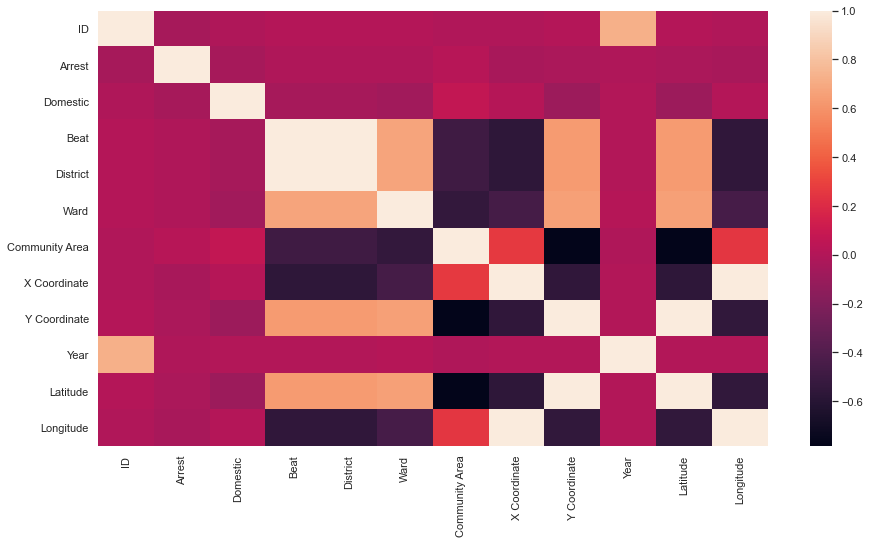

In [11]:
sns.set(rc = {'figure.figsize':(15,8)})
sns.heatmap(df.corr())

### Checking the data types

In [76]:
df.dtypes

ID                        int64
Case Number              object
Date                     object
Block                    object
IUCR                     object
Primary Type             object
Description              object
Location Description     object
Arrest                     bool
Domestic                   bool
Beat                      int64
District                  int64
Ward                    float64
Community Area          float64
FBI Code                 object
X Coordinate            float64
Y Coordinate            float64
Year                      int64
Updated On               object
Latitude                float64
Longitude               float64
Location                 object
Day                       int64
Month                     int64
dtype: object

### Histograms of features in the DataFrame

array([[<AxesSubplot:title={'center':'ID'}>,
        <AxesSubplot:title={'center':'Beat'}>,
        <AxesSubplot:title={'center':'District'}>],
       [<AxesSubplot:title={'center':'Ward'}>,
        <AxesSubplot:title={'center':'Community Area'}>,
        <AxesSubplot:title={'center':'X Coordinate'}>],
       [<AxesSubplot:title={'center':'Y Coordinate'}>,
        <AxesSubplot:title={'center':'Year'}>,
        <AxesSubplot:title={'center':'Latitude'}>],
       [<AxesSubplot:title={'center':'Longitude'}>, <AxesSubplot:>,
        <AxesSubplot:>]], dtype=object)

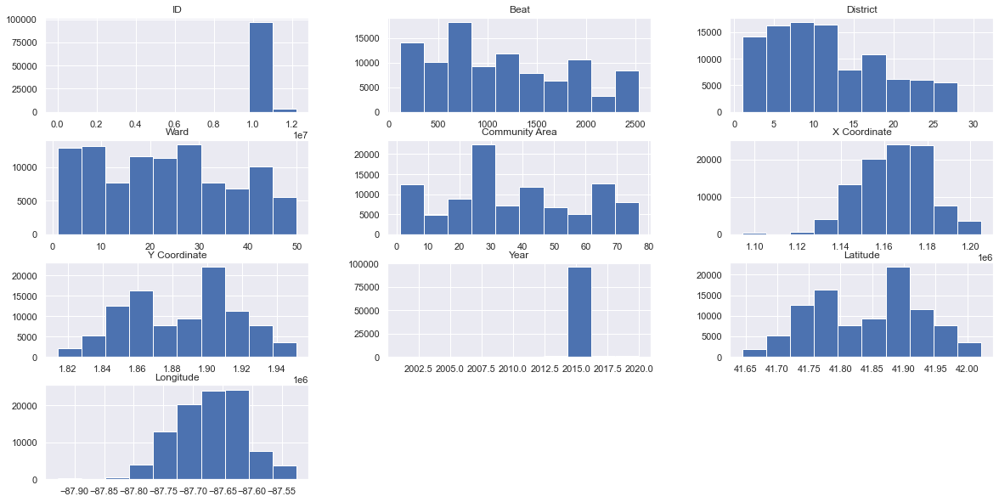

In [12]:
df.hist(figsize=(20,10))

### Bar plot to describe the Description

<AxesSubplot:title={'center':'Decription'}>

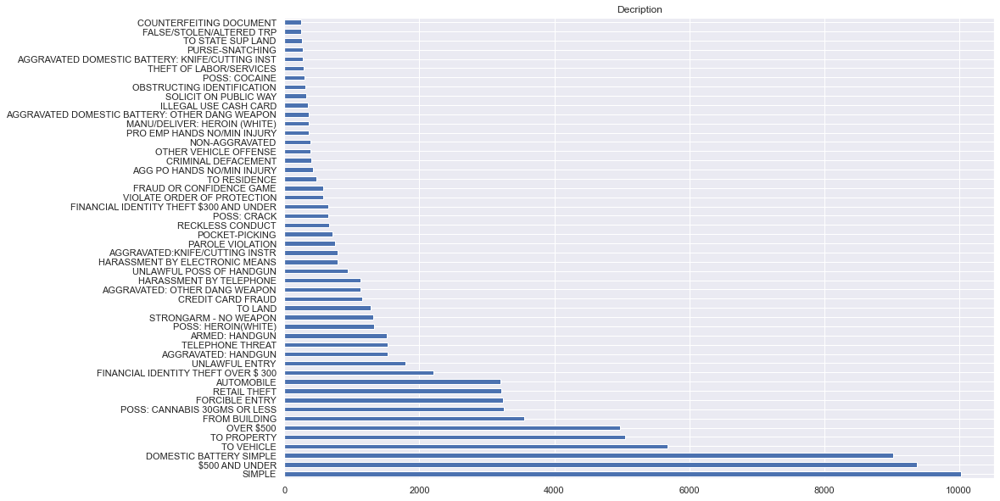

In [77]:
sns.set(rc = {'figure.figsize':(15,10)})
plt.title("Decription")
df.Description.value_counts()[:50].plot(kind='barh')

### Showing the incidents occured in X coordinate in chicago

<AxesSubplot:title={'center':'Incidents occured in X coordinate'}, xlabel='X Coordinate', ylabel='Density'>

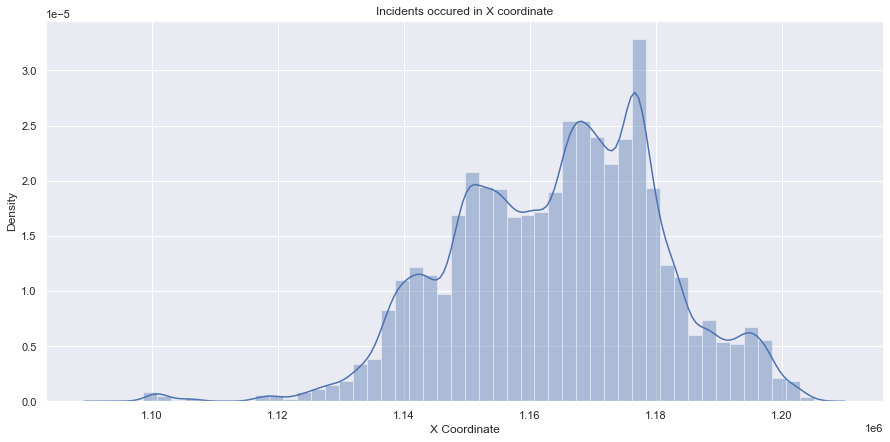

In [80]:
sns.set(rc = {'figure.figsize':(15,7)})
plt.title("Incidents occured in X coordinate")
sns.distplot(df["X Coordinate"])

### Showing the incidents occured in Y coordinate in chicago

<AxesSubplot:title={'center':'Incidents occured in Y coordinate'}, xlabel='Y Coordinate', ylabel='Density'>

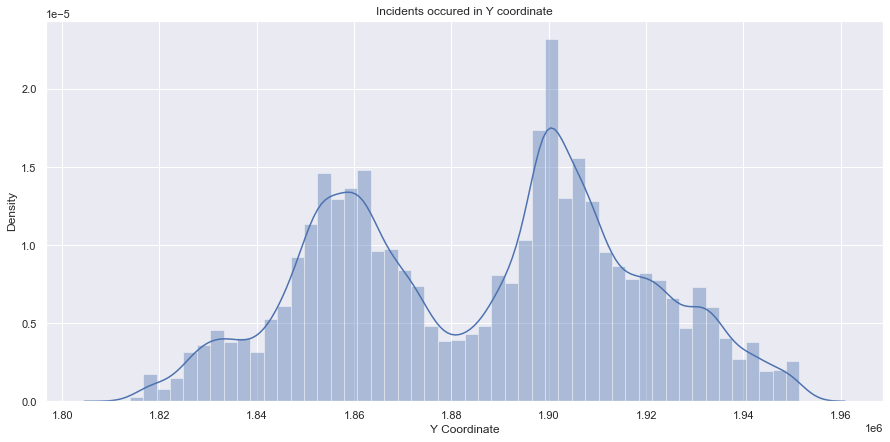

In [81]:
sns.set(rc = {'figure.figsize':(15,7)})
plt.title("Incidents occured in Y coordinate")
sns.distplot(df["Y Coordinate"])

### Joing both X and Y coordinate using the "jointplot"

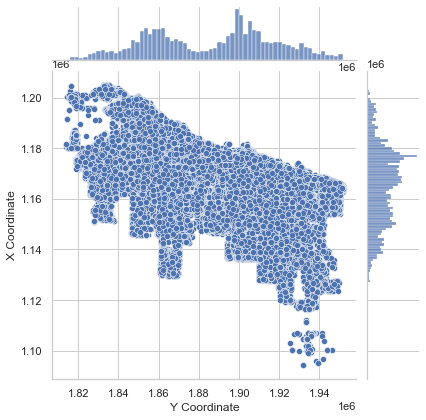

In [83]:
sns.set(rc = {'figure.figsize':(20,7)})
sns.set_style("whitegrid")
sns.jointplot(y="X Coordinate", x="Y Coordinate", data=df)
plt.show()

### Distribution of the type of crime and showing the arrest cases in each crime

<AxesSubplot:xlabel='Primary Type', ylabel='Arrest'>

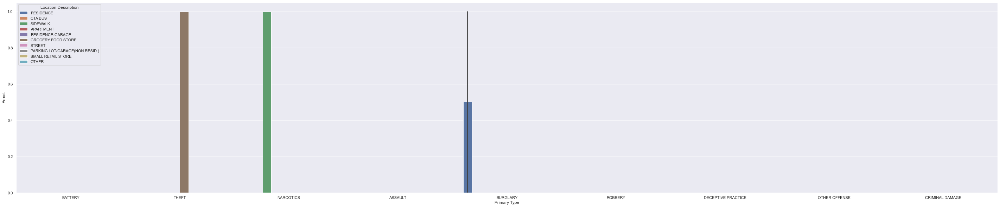

In [86]:
sns.set(rc = {'figure.figsize':(50,10)})
sns.barplot("Primary Type","Arrest",hue='Location Description',data=df[:20])

### Describing the Description using countplot

<AxesSubplot:xlabel='Description', ylabel='count'>

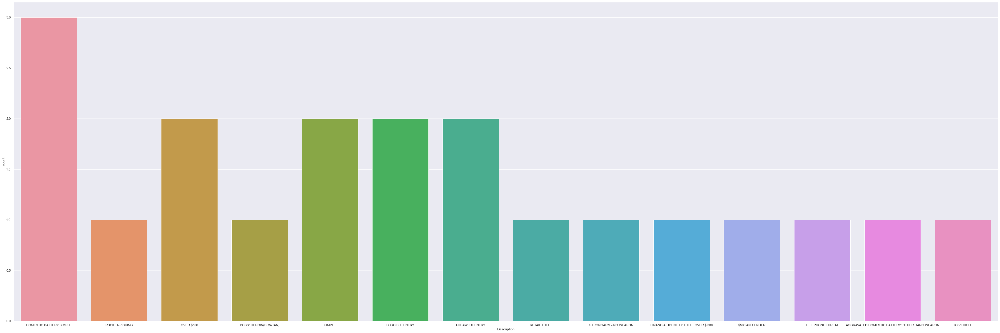

In [19]:
sns.set(rc = {'figure.figsize':(60,20)})
sns.countplot(x= "Description", data=df[:20])

### Line plot for description and district showing the crimes took place in each district

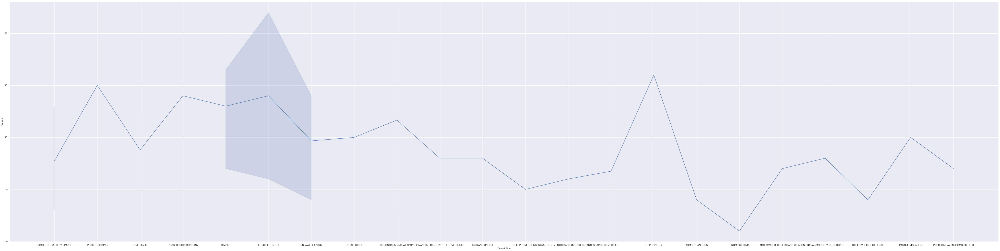

In [20]:
sns.set(rc = {'figure.figsize':(80,20)})
sns.lineplot(x='Description', y='District', data=df[:40])
plt.show()

### Plotting the Description and Primary type which shows the number of crimes and budget crisis depends upon the crime

In [21]:
import plotly.express as px
fig = px.histogram(df, x='Description',color='Primary Type',width=3000, height=1000)
fig.show()

### Showing the rate of crime depending upon the IUCR code

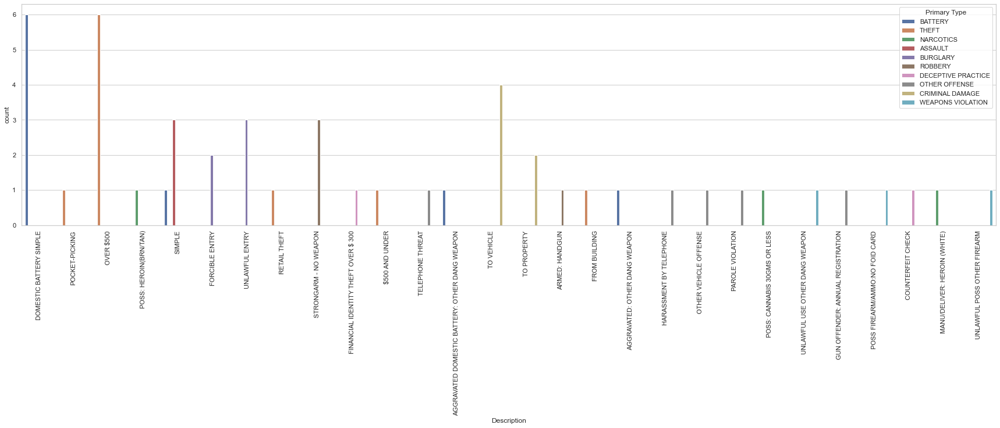

In [95]:
plt.figure(figsize=(30,7))
plt.xticks(rotation=90)
sns.countplot(x="Description",data=df[:50],hue="Primary Type")
sns.set_style("whitegrid")

### Creating three new columns "Day", "Month", "Year" by splitting the Date column in the data frame to create more visualizations

In [23]:
df['Day'] = pd.DatetimeIndex(df['Date']).day
df['Month'] = pd.DatetimeIndex(df['Date']).month
df['Year'] = pd.DatetimeIndex(df['Date']).year

In [24]:
df.head()

,ID,Case Number,Date,Block,IUCR,Primary Type,Description,Location Description,Arrest,Domestic,...,FBI Code,X Coordinate,Y Coordinate,Year,Updated On,Latitude,Longitude,Location,Day,Month
0,10224738,HY411648,09/05/2015 01:30:00 PM,043XX S WOOD ST,0486,BATTERY,DOMESTIC BATTERY SIMPLE,RESIDENCE,False,True,...,08B,1165074.0,1875917.0,2015,02/10/2018 03:50:01 PM,41.815117,-87.670000,"(41.815117282, -87.669999562)",5,9
1,10224739,HY411615,09/04/2015 11:30:00 AM,008XX N CENTRAL AVE,0870,THEFT,POCKET-PICKING,CTA BUS,False,False,...,06,1138875.0,1904869.0,2015,02/10/2018 03:50:01 PM,41.895080,-87.765400,"(41.895080471, -87.765400451)",4,9
2,11646166,JC213529,09/01/2018 12:01:00 AM,082XX S INGLESIDE AVE,0810,THEFT,OVER $500,RESIDENCE,False,True,...,06,NaN,NaN,2018,04/06/2019 04:04:43 PM,NaN,NaN,NaN,1,9
3,10224740,HY411595,09/05/2015 12:45:00 PM,035XX W BARRY AVE,2023,NARCOTICS,POSS: HEROIN(BRN/TAN),SIDEWALK,True,False,...,18,1152037.0,1920384.0,2015,02/10/2018 03:50:01 PM,41.937406,-87.716650,"(41.937405765, -87.716649687)",5,9
4,10224741,HY411610,09/05/2015 01:00:00 PM,0000X N LARAMIE AVE,0560,ASSAULT,SIMPLE,APARTMENT,False,True,...,08A,1141706.0,1900086.0,2015,02/10/2018 03:50:01 PM,41.881903,-87.755121,"(41.881903443, -87.755121152)",5,9


In [25]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 100000 entries, 0 to 99999
Data columns (total 24 columns):
 #   Column                Non-Null Count   Dtype  
---  ------                --------------   -----  
 0   ID                    100000 non-null  int64  
 1   Case Number           100000 non-null  object 
 2   Date                  100000 non-null  object 
 3   Block                 100000 non-null  object 
 4   IUCR                  100000 non-null  object 
 5   Primary Type          100000 non-null  object 
 6   Description           100000 non-null  object 
 7   Location Description  99729 non-null   object 
 8   Arrest                100000 non-null  bool   
 9   Domestic              100000 non-null  bool   
 10  Beat                  100000 non-null  int64  
 11  District              100000 non-null  int64  
 12  Ward                  99995 non-null   float64
 13  Community Area        99995 non-null   float64
 14  FBI Code              100000 non-null  object 
 15  X

### Showing the number of days per crime

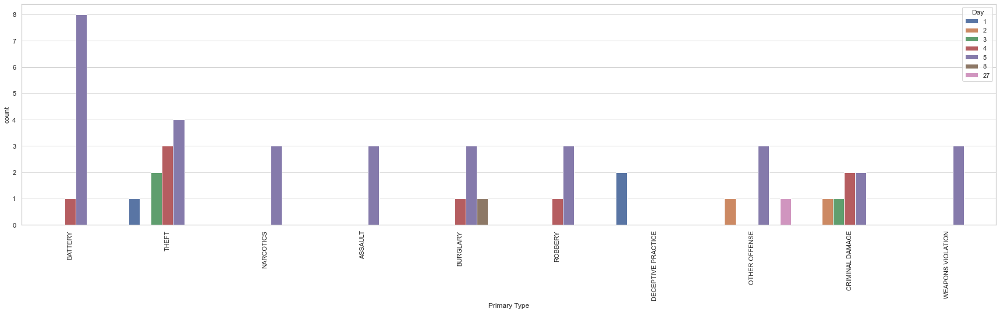

In [46]:
plt.figure(figsize=(30,7))
plt.xticks(rotation=90)
sns.countplot(x="Primary Type",data=df[:50],hue="Day")
sns.set_style("whitegrid")

### Number of crimes per year

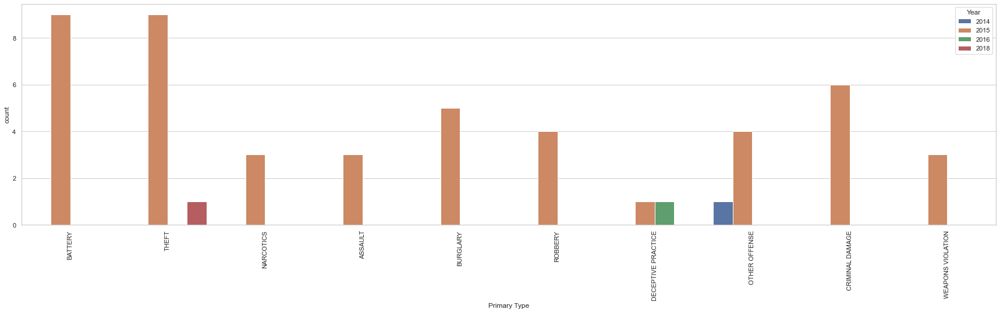

In [47]:
plt.figure(figsize=(30,7))
plt.xticks(rotation=90)
sns.countplot(x="Primary Type",data=df[:50],hue="Year")
sns.set_style("whitegrid")

### Number of crimes for each month

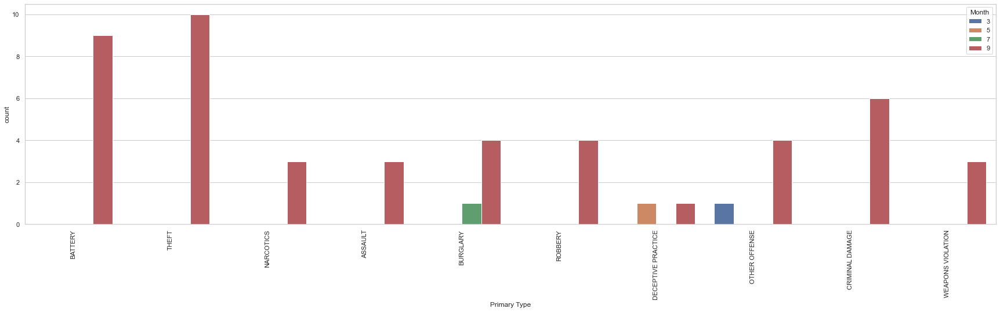

In [48]:
plt.figure(figsize=(30,7))
plt.xticks(rotation=90)
sns.countplot(x="Primary Type",data=df[:50],hue="Month")
sns.set_style("whitegrid")

###  Number of arrest cases for each crime

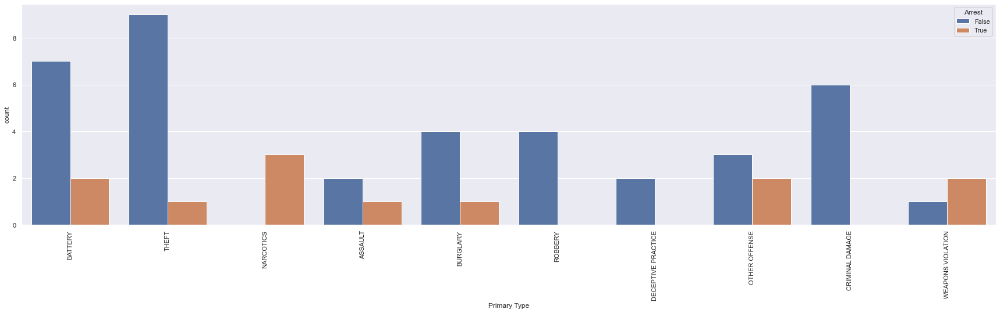

In [92]:
plt.figure(figsize=(30,7))
plt.xticks(rotation=90)
sns.countplot(x="Primary Type",data=df[:50],hue="Arrest")
sns.set_style("whitegrid")

### The latitude and longitude where the crime occured in chicgao using scatter plot

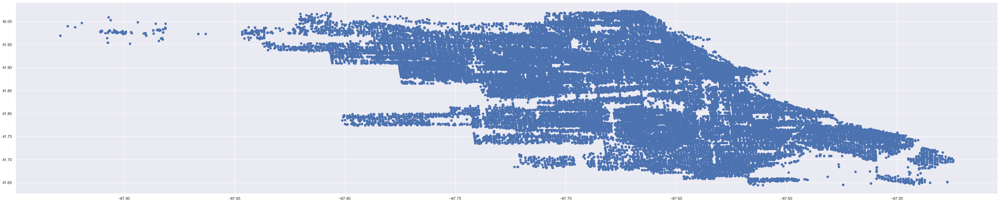

In [72]:
import matplotlib.pyplot as plt
plt.scatter(x=df['Longitude'], y=df['Latitude'])
plt.show()

## These are the basic visualisations for the data frame 